In [1]:
import pandas as pd
import numpy as np
from scipy.io import loadmat
from sklearn.svm import SVC # SVC para classificacao e SVR para regressao
import matplotlib.pyplot as plt

# Parte I - Máquinas de Vetores de Suporte

## SVM - linearmente separáveis

In [2]:
mat = loadmat("dado1.mat")
X = mat["X"]
y = mat["y"]
#print(X)

In [3]:
m,n = X.shape[0],X.shape[1]
pos,neg = (y==1).reshape(m,1),(y==0).reshape(m,1)

### C = 1

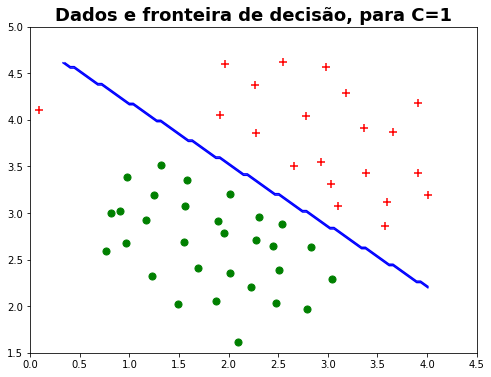

In [4]:
classifier = SVC(C=1, kernel="linear")
classifier.fit(X,np.ravel(y))
plt.figure(figsize=(8,6))
plt.scatter(X[pos[:,0],0],X[pos[:,0],1],c="r",marker="+",s=50)
plt.scatter(X[neg[:,0],0],X[neg[:,0],1],c="g",marker="o",s=50)
X_1,X_2 = np.meshgrid(np.linspace(X[:,0].min(),X[:,0].max(),num=1000),np.linspace(X[:,1].min(),X[:,1].max(),num=1000))
plt.contour(X_1,X_2,classifier.predict(np.array([X_1.ravel(),X_2.ravel()]).T).reshape(X_1.shape),1,colors="b")
plt.title("Dados e fronteira de decisão, para C=1", fontdict={'weight': 'bold', 'size':18})
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.xlim(0,4.5)
plt.ylim(1.5,5)
plt.show()

### C = 50

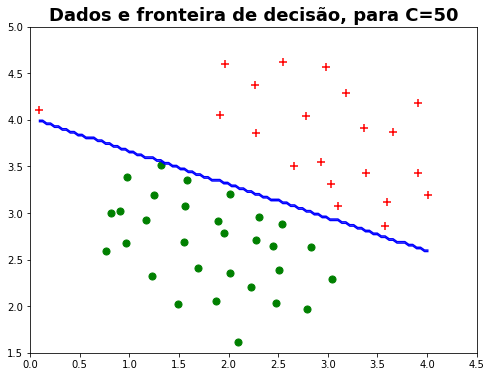

In [5]:
classifier = SVC(C=50, kernel="linear")
classifier.fit(X,np.ravel(y))
plt.figure(figsize=(8,6))
plt.scatter(X[pos[:,0],0],X[pos[:,0],1],c="r",marker="+",s=50)
plt.scatter(X[neg[:,0],0],X[neg[:,0],1],c="g",marker="o",s=50)
X_1,X_2 = np.meshgrid(np.linspace(X[:,0].min(),X[:,0].max(),num=1000),np.linspace(X[:,1].min(),X[:,1].max(),num=1000))
plt.contour(X_1,X_2,classifier.predict(np.array([X_1.ravel(),X_2.ravel()]).T).reshape(X_1.shape),1,colors="b")
plt.title("Dados e fronteira de decisão, para C=50", fontdict={'weight': 'bold', 'size':18})
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.xlim(0,4.5)
plt.ylim(1.5,5)
plt.show()

### C = 100

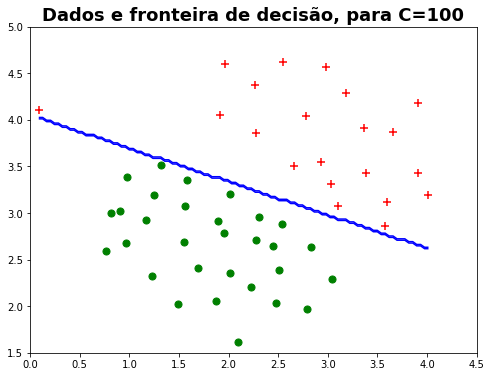

In [6]:
classifier = SVC(C=100, kernel="linear")
classifier.fit(X,np.ravel(y))
plt.figure(figsize=(8,6))
plt.scatter(X[pos[:,0],0],X[pos[:,0],1],c="r",marker="+",s=50)
plt.scatter(X[neg[:,0],0],X[neg[:,0],1],c="g",marker="o",s=50)
X_1,X_2 = np.meshgrid(np.linspace(X[:,0].min(),X[:,0].max(),num=1000),np.linspace(X[:,1].min(),X[:,1].max(),num=1000))
plt.contour(X_1,X_2,classifier.predict(np.array([X_1.ravel(),X_2.ravel()]).T).reshape(X_1.shape),1,colors="b")
plt.title("Dados e fronteira de decisão, para C=100", fontdict={'weight': 'bold', 'size':18})
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.xlim(0,4.5)
plt.ylim(1.5,5)
plt.show()

## SVM - com Kernel Gaussiano

In [7]:
mat = loadmat("dado2.mat")
X = mat["X"]
y = mat["y"]
X_val = mat["Xval"]
y_val = mat["yval"]
print(len(X))
print(np.ravel(y), '\n')
print(len(X_val))
print(np.ravel(y_val))

211
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 0] 

200
[0 1 0 0 0 0 0 1 1 1 1 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 1 1
 0 0 0 0 1 0 0 0 1 1 0 0 1 0 1 1 1 1 1 1 1 1 1 0 0 0 1 0 1 1 1 1 0 1 1 0 1
 0 1 0 0 0 1 0 0 0 1 0 0 1 1 0 0 0 1 0 1 1 0 1 1 0 0 1 1 0 1 1 1 1 1 1 0 1
 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 1 1 1 1 0 1 0 1 1 0 0 1 1 0 0 0 0 0 0 1 0
 0 1 0 1 1 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 1 1 0 0 0 0 1 1 0 0 0 1 0 0 1 1 1
 0 0 1 0 1 0 0 1 1 1 1 0 0 0 0]


In [8]:
m,n = X.shape[0],X.shape[1]
pos,neg = (y==1).reshape(m,1),(y==0).reshape(m,1)

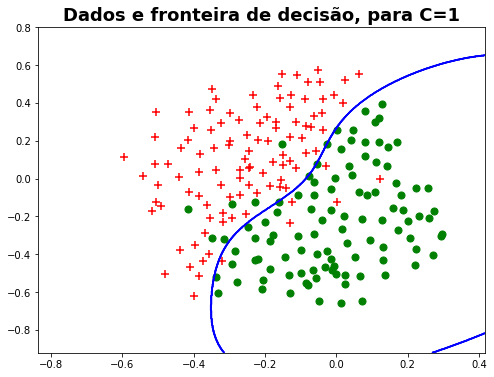

In [12]:
# Não consegui entender qual é o kernel Gaussiano; acho que é esse mesmo; pelo menos é uma função gaussiana
classifier = SVC(kernel="rbf")
classifier.fit(X,np.ravel(y))

plt.figure(figsize=(8,6))
plt.scatter(X[pos[:,0],0],X[pos[:,0],1],c="r",marker="+",s=50)
plt.scatter(X[neg[:,0],0],X[neg[:,0],1],c="g",marker="o",s=50)

sc_p = .4 # 0 < sc_p < 1; escala percentual; o quanto (percentual em relacao aos limites dos dados de treino) vc quer que o grafico aumente para plotar o contorno
X_1min = [X[:,0].min()*(1 - sc_p) if X[:,0].min() > 0 else X[:,0].min()*(1 + sc_p) for i in range(1)][0]
X_1max = [X[:,0].max()*(1 + sc_p) if X[:,0].max() > 0 else X[:,0].max()*(1 - sc_p) for i in range(1)][0]
X_2min = [X[:,1].min()*(1 - sc_p) if X[:,1].min() > 0 else X[:,1].min()*(1 + sc_p) for i in range(1)][0]
X_2max = [X[:,1].max()*(1 + sc_p) if X[:,1].max() > 0 else X[:,1].max()*(1 - sc_p) for i in range(1)][0]

X_1,X_2 = np.meshgrid(np.linspace(X_1min, X_1max,num=1000),np.linspace(X_2min,X_2max,num=1000))
plt.contour(X_1,X_2,classifier.predict(np.array([X_1.ravel(),X_2.ravel()]).T).reshape(X_1.shape),1,colors="b")
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')

plt.contour(X_1,X_2,classifier.predict(np.array([X_1.ravel(),X_2.ravel()]).T).reshape(X_1.shape),1,colors="b")
plt.title("Dados e fronteira de decisão, para C=1", fontdict={'weight': 'bold', 'size':18})
#plt.xlim(0,4.5)
#plt.ylim(1.5,5)
#plt.grid()
plt.show()

## Determinando Hiperparâmetros

Vamos testar diferentes valores para a constante de regularização (C) e para a constante de escala da função gaussiana ($\sigma$): 

$$ K(\mathbf{x}, \mathbf{z}) = \exp\left({ -\dfrac{|| \mathbf{x} - \mathbf{z} ||}{2\sigma^2} } \right)$$

(https://en.wikipedia.org/wiki/Radial_basis_function_kernel)

### Uso do conjunto de validação para determinar C e $\sigma$ ótimos

In [52]:
# NORMALIZAR (SCALING)

n_p = int(10e2) # quantidade de cada parametro que sera testado
s_min = 1e-3
s_max = 1e5
s = np.logspace(np.log10(s_min), np.log10(s_max), n_p, base = 10) # s é o sigma
#s = np.linspace(s_min, s_max, n_p)

C_min = 1e-3
C_max = 1e5
C = np.logspace(np.log10(C_min), np.log10(C_max), n_p, base = 10) # C é o parametro de regularizacao
#C = np.linspace(C_min, C_max, n_p)

1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000
25000
26000
27000
28000
29000
30000
31000
32000
33000
34000
35000
36000
37000
38000
39000
40000
41000
42000
43000
44000
45000
46000
47000
48000
49000
50000
51000
52000
53000
54000
55000
56000
57000
58000
59000
60000
61000
62000
63000
64000
65000
66000
67000
68000
69000
70000
71000
72000
73000
74000
75000
76000
77000
78000
79000
80000
81000
82000
83000
84000
85000
86000
87000
88000
89000
90000
91000
92000
93000
94000
95000
96000
97000
98000
99000
100000
101000
102000
103000
104000
105000
106000
107000
108000
109000
110000
111000
112000
113000
114000
115000
116000
117000
118000
119000
120000
121000
122000
123000
124000
125000
126000
127000
128000
129000
130000
131000
132000
133000
134000
135000
136000
137000
138000
139000
140000
141000
142000
143000
144000
145000
146000
147000
148000
149000
150000
151000
152000
153000
154000
155000
156000
157000
158000
15

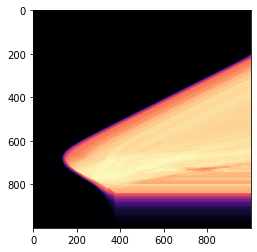

In [53]:
Hp = np.zeros( (n_p, n_p) ) # espaço dos HiperParametros; matriz guarda a performance de cada combinacao de HiperParametros
s_grid, C_grid = np.meshgrid(s, C)
cont = 0

s_otimo = -1 # se no final a resposta for -1 é pq deu errado
C_otimo = -1 # se no final a resposta for -1 é pq deu errado
taxa_otima = 0
for i, si in enumerate(s):
    for j, Ci in enumerate(C):
        gamma = (1/2)*(si)**(-2)
        classifier = SVC(kernel="rbf", C = Ci, gamma = gamma)
        classifier.fit(X,np.ravel(y))
        res = classifier.predict( X_val )
        taxa_acerto = (res == y_val.ravel()).sum() / len(y_val.ravel())
        #print( taxa_acerto )
        Hp[n_p-1 - i, j] = taxa_acerto
        
        if taxa_otima < taxa_acerto:
            s_otimo = si
            C_otimo = Ci
            taxa_otima = taxa_acerto
        
        cont += 1
        if cont % 1000 == 0:
            print(cont)

plt.imshow(Hp, cmap = 'magma')




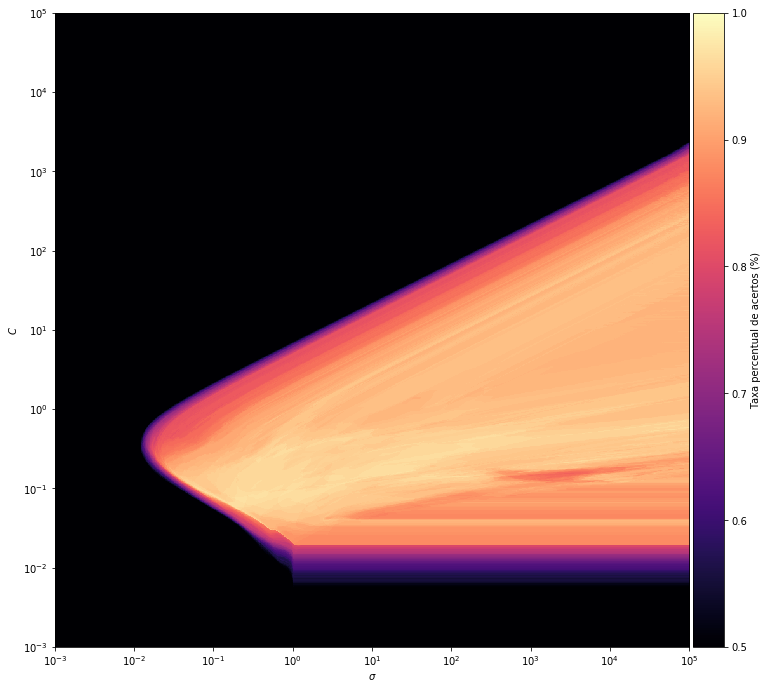

In [61]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
plt.figure(figsize=(12,12))

#x_labels = ['$10^{' + str(int(np.log10(si))) + '}$' for si in s]
#y_labels = ['$10^{' + str(int(np.log10(Ci))) + '}$' for Ci in s]

x_labels = ['$10^{' + str(int(np.log10(s[0])+i)) + '}$' for i in range(9)]
y_labels = ['$10^{' + str(int(np.log10(C[0])+i)) + '}$' for i in range(9)]

#fig, ax = plt.subplots()
im = plt.imshow(Hp**1, cmap = 'magma', extent=[s_min, s_max, C_min, C_max])
# put the major ticks at the middle of each cell
plt.xlabel('$\sigma$')
plt.ylabel('$C$')
#ax.set_xticks(np.arange(len(x_labels)) + 0, minor=False)
#ax.set_yticks(np.arange(len(y_labels)) + 0, minor=False)
ax = plt.gca()
ax.set_xticks(np.arange(len(x_labels))*s_max/(len(y_labels)-1) + 0, minor=False)
ax.set_yticks(np.arange(len(y_labels))*C_max/(len(y_labels)-1) + 0, minor=False)

# want a more natural, table-like display
#ax.invert_yaxis()
#ax.xaxis.tick_top()

from mpl_toolkits.axes_grid1 import make_axes_locatable
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

fig = plt.gcf()
plt.clim(.5,1)
cbar = fig.colorbar(im, ax=ax, cax=cax)

cbar.ax.set_ylabel('Taxa percentual de acertos (%)')


ax.set_xticklabels(x_labels, minor=False)
ax.set_yticklabels(y_labels, minor=False)
plt.savefig('final2.png', figsize=(12, 12) )

In [63]:
print(s_otimo, C_otimo, taxa_otima)
for i in range(n_p):
    for j in range(n_p):
        print(Hp[i,j])

0.05994842503189409 0.17148819698705392 0.97
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.445
0.455
0.47
0.49
0.495
0.5
0.52
0.535
0.55
0.565
0.59
0.595
0.605
0.61
0.625
0.63
0.65
0.66
0.675
0.665
0.665
0.67
0.685
0.685
0.7
0.715
0.72
0.715
0.715
0.73
0.74
0.735
0.74
0.75
0.75
0.77
0.77
0.775
0.775
0.795
0.8
0.81
0.815
0.815
0.81
0.81
0.815
0.815
0.815
0.82
0.815
0.815
0.815
0.815
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.44
0.455
0.465
0.49
0.495
0.5
0.515
0.535
0.545
0.56
0.585
0.59
0.605
0.61
0.615
0.625
0.645
0.65
0.67
0.665
0.66
0.67
0.67
0.685
0.69
0.705
0.72
0.72
0.715
0.725
0.735
0.74
0.735
0.745
0.755
0.765
0.77
0.775
0.775
0.785
0.795
0.8
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.82
0.82
0.82
0.82
0.82
0.82
0.825
0.825
0.82
0.82
0.82
0.82
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.4

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.44
0.455
0.465
0.485
0.495
0.5
0.51
0.535
0.545
0.555
0.585
0.59
0.6
0.61
0.615
0.625
0.64
0.65
0.66
0.665
0.665
0.67
0.665
0.685
0.69
0.705
0.72
0.72
0.715
0.725
0.735
0.74
0.735
0.745
0.755
0.76
0.77
0.775
0.775
0.785
0.79
0.8
0.815
0.815
0.81
0.81
0.81
0.815
0.815
0.815
0.815
0.815
0.81
0.81
0.81
0.815
0.815
0.815
0.815
0.815
0.815
0.82
0.82
0.82
0.825
0.825
0.825
0.825
0.825
0.825
0.82
0.825
0.825
0.825
0.825
0.825
0.825
0.83
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.83
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.855
0.85
0.85
0.855
0.855
0.855
0.85
0.85
0.85
0.85
0.85
0.855
0.855
0.855
0.855
0.86
0.86
0.86
0.86
0.86
0.86
0.865
0.865
0.865
0.865
0.87
0.865
0.87
0.87
0.87
0.87
0.88
0.88
0.885
0.435
0.435
0.435

0.78
0.79
0.8
0.81
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.81
0.81
0.81
0.815
0.815
0.815
0.815
0.815
0.815
0.82
0.815
0.82
0.82
0.825
0.825
0.825
0.82
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.82
0.825
0.82
0.825
0.825
0.825
0.825
0.825
0.83
0.835
0.84
0.84
0.845
0.845
0.845
0.845
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.855
0.855
0.855
0.855
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.845
0.855
0.855
0.855
0.86
0.865
0.865
0.865
0.865
0.865
0.865
0.865
0.865
0.87
0.88
0.87
0.87
0.875
0.885
0.885
0.885
0.885
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435


0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.45
0.465
0.485
0.495
0.5
0.51
0.535
0.545
0.555
0.585
0.59
0.6
0.61
0.615
0.625
0.64
0.65
0.66
0.665
0.665
0.67
0.665
0.685
0.69
0.705
0.72
0.72
0.715
0.72
0.735
0.74
0.735
0.74
0.75
0.755
0.77
0.775
0.775
0.78
0.79
0.8
0.81
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.81
0.815
0.815
0.815
0.815
0.815
0.815
0.82
0.82
0.82
0.82
0.825
0.825
0.825
0.82
0.82
0.82
0.825
0.825
0.825
0.825
0.825
0.83
0.825
0.83
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.835
0.835
0.84
0.84
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.85
0.85
0.85
0.855
0.85
0.85
0.85
0.85
0.855
0.855
0.85
0.85
0.85
0.85
0.85
0.85
0.86
0.86
0.86
0.86
0.86
0.86


0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.825
0.82
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.83
0.83
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.83
0.835
0.84
0.84
0.845
0.845
0.845
0.845
0.845
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.855
0.855
0.855
0.85
0.85
0.85
0.855
0.855
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.86
0.855
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.865
0.865
0.865
0.87
0.87
0.875
0.88
0.885
0.885
0.885
0.885
0.885
0.885
0.89
0.89
0.89
0.89
0.895
0.9
0.895
0.89
0.89
0.9
0.9
0.9
0.9
0.9
0.9
0.89
0.89
0.89
0.89
0.89
0.895
0.895
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.91
0.91
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.91
0.91
0.915
0.915
0.92
0.92
0.92
0.92
0.92
0.915
0.915
0.915
0.915
0.92
0.92
0.92
0.925
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.

0.915
0.915
0.915
0.91
0.915
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.92
0.92
0.92
0.915
0.915
0.92
0.92
0.92
0.92
0.92
0.925
0.925
0.925
0.925
0.925
0.92
0.92
0.925
0.925
0.93
0.93
0.93
0.935
0.94
0.94
0.935
0.94
0.94
0.94
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.61
0.615
0.625
0.64
0.65
0.66
0.67
0.665
0.67
0.67
0.685
0.69
0.705
0.72
0.72
0.715
0.72
0.735
0.745
0.735
0.74
0.75
0.755
0.77
0.775
0.775
0.78
0.795
0.8
0.81
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.81
0.81
0.815
0.815
0.815
0.815
0.815
0.815
0.82
0.815
0.82
0.82
0.825
0.825
0.825
0.82
0.82
0.82
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.83
0.83
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.83
0.835
0.84
0.84
0.845
0.845
0.845
0.845
0.845
0.85
0.85
0.845
0.85
0.85
0.845
0.85
0.85
0.855
0.855
0.855
0.85
0.85
0.85
0.855
0.855
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.865
0.865
0.865
0.87
0.87
0.87
0.88
0.88
0.885
0.885
0.885
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.905
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.915
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915


0.825
0.825
0.825
0.825
0.83
0.83
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.83
0.835
0.84
0.84
0.845
0.845
0.845
0.845
0.845
0.85
0.85
0.85
0.85
0.85
0.845
0.85
0.85
0.855
0.855
0.855
0.85
0.85
0.85
0.855
0.855
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.865
0.865
0.865
0.87
0.87
0.87
0.88
0.88
0.885
0.885
0.885
0.885
0.89
0.89
0.89
0.89
0.89
0.89
0.895
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.905
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.915
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.91
0.915
0.915
0.915
0.915
0.915
0.92
0.92
0.92
0.915
0.92
0.92
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.92
0.92
0.925
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.94
0.94
0.935
0.935
0.935
0.935
0.935
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.93
0.935
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.9

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.45
0.465
0.485
0.49
0.5
0.51
0.535
0.54
0.555
0.585
0.59
0.6
0.61
0.615
0.625
0.64
0.65
0.66
0.67
0.665
0.67
0.67
0.685
0.69
0.705
0.72
0.72
0.715
0.72
0.735
0.745
0.735
0.74
0.75
0.755
0.77
0.775
0.775
0.78
0.795
0.8
0.81
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.81
0.81
0.81
0.815
0.815
0.815
0.815
0.815
0.815
0.82
0.815
0.82
0.825
0.825
0.825
0.825
0.82
0.82
0.82
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.83
0.83
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.83
0.835
0.84
0.845
0.845
0.845
0.845
0.845
0.845
0.85
0.85
0.85
0.85
0.85
0.845
0.85
0.85
0.855
0.855
0.855
0.85
0.85
0.85
0.855
0.855
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.865
0.865
0.865
0.87
0.87
0.87
0.88
0.88
0.885
0.885
0.885
0.885
0.89
0.89
0.89
0.89
0.89
0.89
0.895
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.905
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.775
0.775
0.78
0.795
0.8
0.81
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.81
0.81
0.81
0.815
0.815
0.815
0.815
0.815
0.815
0.82
0.815
0.82
0.825
0.825
0.825
0.825
0.82
0.82
0.82
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.83
0.83
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.83
0.835
0.84
0.845
0.845
0.845
0.845
0.845
0.845
0.85
0.85
0.85
0.85
0.85
0.845
0.85
0.85
0.855
0.855
0.855
0.85
0.85
0.85
0.855
0.855
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.865
0.865
0.865
0.87
0.87
0.87
0.88
0.88
0.885
0.885
0.885
0.885
0.89
0.89
0.89
0.89
0.89
0.89
0.895
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.905
0.91
0.91
0.91
0.905
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.915
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.91
0.915
0.915
0.915
0.915
0.915
0.915
0.92
0.92
0.915
0.915
0.92
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.92


0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.825
0.83
0.835
0.84
0.84
0.845
0.845
0.845
0.845
0.845
0.85
0.85
0.85
0.85
0.85
0.845
0.85
0.85
0.855
0.855
0.855
0.85
0.85
0.85
0.855
0.855
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.865
0.865
0.865
0.87
0.87
0.87
0.88
0.88
0.885
0.885
0.885
0.885
0.89
0.89
0.89
0.89
0.89
0.89
0.895
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.905
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.915
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.91
0.915
0.915
0.915
0.915
0.915
0.915
0.92
0.92
0.915
0.915
0.92
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.92
0.92
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.94
0.94
0.94
0.935
0.935
0.935
0.935
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93

0.845
0.85
0.85
0.85
0.85
0.85
0.845
0.85
0.85
0.855
0.855
0.855
0.85
0.85
0.85
0.855
0.855
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.865
0.865
0.865
0.87
0.87
0.87
0.88
0.88
0.885
0.885
0.885
0.885
0.89
0.89
0.89
0.89
0.89
0.89
0.895
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.905
0.91
0.91
0.91
0.905
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.915
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.91
0.915
0.915
0.91
0.91
0.915
0.915
0.92
0.92
0.915
0.915
0.92
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.92
0.92
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.94
0.94
0.94
0.935
0.935
0.935
0.935
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.9

0.855
0.855
0.85
0.85
0.85
0.855
0.855
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.865
0.865
0.865
0.87
0.87
0.87
0.88
0.88
0.885
0.885
0.885
0.885
0.89
0.89
0.89
0.89
0.89
0.89
0.895
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.905
0.91
0.91
0.91
0.905
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.915
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.91
0.915
0.915
0.91
0.91
0.915
0.92
0.92
0.92
0.915
0.915
0.92
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.92
0.92
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.94
0.94
0.94
0.935
0.935
0.935
0.935
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.9

0.85
0.85
0.85
0.85
0.85
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.865
0.865
0.865
0.87
0.87
0.87
0.88
0.88
0.885
0.885
0.885
0.885
0.89
0.89
0.89
0.89
0.89
0.89
0.895
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.905
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.915
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.91
0.915
0.915
0.91
0.91
0.915
0.915
0.92
0.92
0.915
0.915
0.92
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.92
0.92
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.94
0.94
0.94
0.935
0.935
0.935
0.935
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.935
0.935


0.86
0.86
0.86
0.86
0.865
0.865
0.865
0.87
0.87
0.87
0.88
0.88
0.885
0.885
0.885
0.885
0.89
0.89
0.89
0.89
0.89
0.89
0.895
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.905
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.915
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.91
0.915
0.915
0.91
0.91
0.915
0.92
0.92
0.92
0.915
0.915
0.92
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.92
0.92
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.94
0.94
0.94
0.935
0.935
0.935
0.935
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.925
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0

0.87
0.88
0.88
0.885
0.885
0.885
0.885
0.89
0.89
0.89
0.89
0.89
0.89
0.895
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.905
0.91
0.91
0.91
0.905
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.915
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.91
0.915
0.915
0.91
0.91
0.915
0.92
0.92
0.92
0.915
0.915
0.92
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.92
0.92
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.94
0.94
0.94
0.935
0.935
0.935
0.935
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.925
0.925
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.815
0.815
0.815
0.815
0.815
0.82
0.82
0.82
0.825
0.825
0.825
0.825
0.82
0.82
0.82
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.83
0.83
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.83
0.835
0.84
0.84
0.845
0.845
0.845
0.845
0.845
0.85
0.85
0.85
0.85
0.85
0.845
0.85
0.85
0.855
0.855
0.855
0.85
0.85
0.85
0.855
0.855
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.865
0.865
0.865
0.87
0.87
0.87
0.88
0.88
0.885
0.885
0.885
0.885
0.89
0.89
0.89
0.89
0.89
0.89
0.895
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.905
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.915
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.91
0.915
0.915
0.91
0.91
0.915
0.915
0.92
0.92
0.915
0.915
0.92
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.92
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.94
0.94
0.94
0.935
0.935
0.935
0.935
0.92
0.92
0.92
0.

0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.4

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.9

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.45
0.465
0.48
0.49
0.5
0.51
0.525
0.54
0.555
0.58
0.59
0.6
0.61
0.615
0.625
0.635
0.65
0.66
0.675
0.665
0.67
0.67
0.685
0.69
0.705
0.715
0.72
0.715
0.72
0.735
0.745
0.735
0.74
0.75
0.755
0.77
0.775
0.775
0.775
0.795
0.8
0.81
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.81
0.81
0.815
0.815
0.815
0.815
0.815
0.815
0.82
0.82
0.82
0.825
0.825
0.825
0.825
0.82
0.82
0.82
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.83
0.83
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.83
0.835
0.84
0.84
0.845
0.845
0.845
0.845
0.845
0.85
0.85
0.845
0.85
0.85
0.845
0.85
0.85
0.855
0.855
0.855
0.85
0.85
0.85
0.855
0.855
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.865
0.865
0.865
0.87
0.87
0.87
0.88
0.88
0.885
0.885
0.885
0.885
0.89
0.89
0.89
0.89
0.89
0.89
0.895
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.905
0.91
0.91
0.91
0.905
0.91
0.91
0.91
0.91
0.91
0.91
0

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.45
0.465
0.48
0.49
0.5
0.51
0.525
0.54
0.555
0.58
0.59
0.6
0.61
0.615
0.625
0.635
0.65
0.66
0.675
0.665
0.67
0.67
0.685
0.69
0.705
0.715
0.72
0.715
0.72
0.735
0.745
0.735
0.74
0.75
0.755
0.77
0.77
0.7

0.925
0.92
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.94
0.94
0.94
0.935
0.935
0.935
0.935
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.93
0.93
0.9

0.9
0.9
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.905
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.915
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.91
0.915
0.915
0.91
0.91
0.915
0.915
0.92
0.92
0.915
0.915
0.92
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.92
0.92
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.94
0.94
0.94
0.935
0.935
0.935
0.935
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935


0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.4

0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.93
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.92

0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.93
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.9

0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.93
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.445
0.455
0.47
0.49
0.495
0.5
0.52
0.535
0.55
0.565
0.59
0.595
0.605
0.61
0.625
0.63
0.65
0.66
0.675
0.66
0.665
0.67
0.685
0.685
0.695
0.71
0.72
0.72
0.715
0.73
0.74
0.74
0.74
0.75
0.755
0.765
0.775
0.775
0.775
0.79
0.8
0.805
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.81
0.81
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.82
0.82
0.82
0.82
0.825
0.825
0.82
0.82
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.83
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.835
0.84
0.84
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.85
0.85
0.845
0.85
0.85
0.855
0.855
0.855
0.85
0.85
0.85
0.85
0.855
0.85
0.85
0.85
0.

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.775
0.775
0.785
0.795
0.8
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.81
0.81
0.815
0.815
0.81
0.815
0.815
0.815
0.815
0.82
0.82
0.82
0.82
0.825
0.825
0.82
0.82
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.83
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.835
0.835
0.84
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.85
0.85
0.85
0.845
0.85
0.85
0.855
0.855
0.855
0.85
0.85
0.85
0.85
0.855
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.865
0.865
0.865
0.87
0.87
0.87
0.88
0.88
0.885
0.885
0.885
0.885
0.885
0.89
0.89
0.89
0.89
0.89
0.895
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.905
0.91
0.91
0.91
0.905
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.91
0.915
0.915
0.915
0.915
0.915
0.915
0.92
0.92
0.915
0.915
0.92
0.92
0.92
0.925
0.925
0.925
0.925
0.925
0.92
0.92


0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.

0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92


0.92
0.92
0.92
0.92
0.92
0.915
0.915
0.92
0.92
0.92
0.925
0.925
0.925
0.925
0.925
0.92
0.925
0.93
0.93
0.935
0.935
0.935
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.935
0.935
0.93
0.92
0.92
0.925
0.925
0.92
0.925
0.925
0.92
0.92
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.92
0.92
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.93
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.45
0.46
0.47
0.49
0.5
0.51
0.535
0.54
0.555
0.575
0.59
0.61
0.61
0.615
0.625
0.645
0.65
0.67
0.675
0.665
0.67
0.675
0.685
0.695
0.705
0.72
0.72
0.715
0.725
0.74
0.74
0.735
0.745
0.755
0.76
0.77
0.775
0.775
0.785
0.795
0.8
0.81
0.815
0.815
0.815
0.8

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.44
0.45
0.47
0.49
0.495
0.5
0.525
0.535
0.55
0.565
0.59
0.6
0.61
0.615
0.62
0.63
0.645
0.66
0.675
0.66
0.67
0.67
0.685
0.69
0.705
0.715
0.72
0.72
0.72
0.73
0.74
0.74
0.74
0.75
0.76
0.77
0.775
0.775
0.775
0.795
0.8
0.805
0.815
0.815
0.81
0.81
0.81
0.815
0.815
0.815
0.815
0.815
0.81
0.81
0.815
0.815
0.8

0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.92
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.

0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.92
0.92
0.92
0.92
0.92
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925

0.49
0.49
0.505
0.525
0.535
0.555
0.575
0.59
0.61
0.61
0.615
0.62
0.64
0.66
0.67
0.67
0.675
0.675
0.68
0.685
0.695
0.71
0.72
0.72
0.715
0.73
0.74
0.745
0.735
0.75
0.755
0.76
0.775
0.775
0.775
0.785
0.795
0.8
0.805
0.815
0.815
0.81
0.81
0.81
0.815
0.815
0.815
0.815
0.81
0.81
0.81
0.81
0.815
0.815
0.815
0.815
0.815
0.82
0.82
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.83
0.83
0.835
0.835
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.85
0.845
0.845
0.85
0.85
0.85
0.85
0.85
0.85
0.845
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.86
0.86
0.86
0.865
0.86
0.86
0.86
0.865
0.865
0.865
0.865
0.865
0.865
0.865
0.87
0.875
0.875
0.875
0.885
0.885
0.885
0.885
0.89
0.89
0.89
0.89
0.89
0.895
0.89
0.89
0.89
0.89
0.89
0.9
0.9
0.9
0.9
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.895
0.89
0.89
0.9
0.9
0.9
0.9
0.9
0.9
0.905
0.905
0.905
0.905
0.905
0.905
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.9

0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.925
0.93
0.93
0.93

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.45
0.47
0.49
0.49
0.505
0.535
0.545
0.56
0.575
0.595
0.605
0.615
0.62
0.625
0.645
0.66
0.67
0.67
0.675
0.675
0.69
0.695
0.705
0.715
0.72
0.72
0.72
0.73
0.74
0.74
0.74
0.75
0.755
0.77
0.775
0.775
0.775
0.785
0.8
0.805
0.815
0.815
0.81
0.81
0.81
0.815
0.815
0.815
0.815
0.815
0.81
0.81
0.81
0.815
0.815
0.815
0.815
0.815
0.815
0.82
0.82
0.82
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.82
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.83
0.83
0.835
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.94
0.935
0.935
0.935
0.935
0.935
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.935
0.935
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94


0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.94
0.935
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.935
0.935
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.935
0.935
0.935
0.935
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0

0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.935


0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.455
0.49
0.5
0.52
0.555
0.57
0.575
0.595
0.61
0.62
0.63
0.645
0.655
0.66
0.67
0.675
0.695
0.705
0.715
0.72
0.72
0.72
0.725
0.735
0.735
0.745
0.745
0.75
0.755
0.76
0.77
0.775
0.775
0.775
0.795
0.795
0.8
0.81
0.82
0.815
0.81
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.82
0.815
0.815
0.815
0.815
0.82
0.825
0.82
0.82
0.825
0.825
0.825
0.825
0.825
0.825
0.82
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.82
0.82
0.825
0.825
0.825
0.825
0.825
0.825
0.83
0.84
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.85
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.865
0.865
0.865
0.87
0.87
0.865
0.865
0.87
0.87
0.885
0.885
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.895
0.9
0.9
0.9
0.89
0.89


0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.44
0.46
0.5
0.52
0.555
0.57
0.58
0.595
0.605
0.615
0.63
0.645
0.66
0.66
0.67
0.685
0.69
0.715
0.72
0.72
0.72
0.725
0.725
0.735
0.735
0.745
0.75
0.755
0.755
0.76
0.775
0.78
0.78
0.775
0.795
0.795
0.805
0.81
0.815
0.815
0.81
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.82
0.815
0.815
0.815
0.815
0.815
0.82
0.825
0.825
0.82
0.83
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.84
0.84
0.84
0.84
0.845
0.845
0.835
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.85
0.85
0.855
0.855
0.86
0.86
0.86
0.86
0.865
0.865
0.865
0.865
0.865
0.865
0.865
0.865
0.865
0.87
0.87
0.87
0.88
0.885
0.885
0.885
0.885
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.895
0.895
0.9
0.89
0.895
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9


0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.45
0.5
0.525
0.555
0.57
0.585
0.6
0.6
0.62
0.645
0.65
0.655
0.665
0.68
0.69
0.7
0.725
0.73
0.72
0.725
0.73
0.73
0.74
0.74
0.75
0.75
0.755
0.765
0.77
0.78
0.785
0.775
0.785
0.795
0.805
0.81
0.815
0.82
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.815
0.82
0.82
0.815
0.815
0.815
0.815
0.82
0.82
0.825
0.825
0.825
0.825
0.82
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.82
0.82
0.82
0.825
0.825
0.825
0.825
0.825
0.825
0.835
0.835
0.825
0.835
0.84
0.84
0.845
0.84
0.835
0.835
0.835
0.835
0.835
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.85
0.855
0.855
0.855
0.855
0.86
0.865
0.865
0.865
0.865
0.865
0.865
0.865
0.86
0.86
0.865
0.87
0.87
0.87
0.87
0.87
0.875
0.88
0.88
0.88
0.89
0.89
0.89
0.89
0.885
0.885
0.89
0.89
0.895
0.895
0.895
0.895
0.895
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.905
0.905
0.905
0.905
0.905
0.91
0.91
0.915
0.9

0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.94
0.94
0.94
0.94
0.94
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.945
0.945
0.945
0.945
0.94
0.945
0.945
0.95
0.95
0.95
0.95
0.945
0.945
0.945
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.945
0.95
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.9

0.785
0.785
0.79
0.795
0.805
0.81
0.815
0.815
0.815
0.815
0.82
0.82
0.815
0.815
0.82
0.82
0.815
0.815
0.815
0.82
0.815
0.82
0.82
0.825
0.825
0.825
0.82
0.82
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.815
0.82
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.825
0.83
0.835
0.835
0.84
0.84
0.84
0.835
0.835
0.83
0.835
0.835
0.835
0.835
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.85
0.85
0.85
0.855
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.865
0.87
0.88
0.88
0.88
0.875
0.875
0.89
0.89
0.885
0.89
0.885
0.885
0.89
0.89
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.9
0.9
0.9
0.9
0.9
0.905
0.905
0.91
0.91
0.91
0.91
0.91
0.905
0.905
0.905
0.905
0.905
0.91
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.92
0.92
0.925
0.93
0.93
0.93
0.925
0.925
0.92
0.92
0.92
0.925
0.925
0.925
0.925
0.925
0.925
0.92
0.925
0.925
0.925
0.925
0.92
0.92
0.92
0.925
0.925


0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.945
0.945
0.945
0.945
0.95
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.945
0.945
0.945
0.95
0.95
0.945
0.945
0.945
0.945
0.945
0.945
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.94
0.94
0.94
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945


0.95
0.95
0.95
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.955
0.95
0.95
0.95
0.95
0.95
0.95
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95

0.95
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.945
0.945
0.945
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.94
0.94
0.94
0.945
0.94
0.94
0.94
0.94
0.94
0.94
0.945
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.

0.945
0.945
0.945
0.945
0.945
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.94
0.94
0.945
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.95

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.46
0.5
0.52
0.55
0.57
0.605
0.625
0.645
0.675
0.675
0.7
0.705
0.72
0.725
0.73
0.735
0.755
0.765
0.775
0.78
0.785
0.795
0.8
0.795
0.785
0.79
0.79
0.81
0.81
0.815
0.815
0.825
0.82
0.82
0.825
0.83
0.825
0.825
0.825
0.825
0.825
0.83
0.83
0.83
0.835
0.835
0.835
0.835
0.835
0.835
0.835
0.835
0.835
0.835
0.835
0.84
0.84
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.85
0.85
0.845
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.85
0.855
0.855
0.855
0.855
0.855
0.86
0.86
0.86
0.865
0.865
0.865
0.865
0.87
0.87
0.87
0.865
0.875
0.875
0.875
0.88
0.88
0.885
0.89
0.89
0.895
0.895
0.89

0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955

0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.965
0.965
0.965
0.965
0.965
0.965
0.965
0.965
0.965
0.965
0.965
0.965
0.965
0.965
0.965
0.965
0.965
0.965
0.965
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.95
0.95
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.

0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.955
0.955
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.955
0.96
0.96
0.96
0.96
0.96
0.965
0.965
0.965
0.955
0.955
0.955
0.965
0.965
0.965
0.965
0.965
0.965
0.965
0.965
0.965
0.965
0.965
0.96
0.96
0.96
0.955
0.96
0.96
0.955
0.955
0.955
0.955
0.955
0.95
0.95
0.95
0.95
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.945
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.945
0.945
0.95
0.955
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.955
0.955
0.955
0.955
0.96
0.96
0.96
0.96
0.96
0

0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.945
0.945
0.945
0.94
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.94
0.94
0.94
0.94
0.94
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.92
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435

0.91
0.91
0.91
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.925
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.93
0.93
0.935
0.94
0.94
0.935
0.935
0.935
0.935
0.935
0.935
0.94
0.94
0.945
0.945
0.945
0.945
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.955
0.955
0.955
0.955
0.955
0.96
0.965
0.965
0.965
0.965
0.965
0.965
0.965
0.965
0.965
0.965
0.965
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.95
0.955
0.955
0.955
0.955
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.445
0.465
0.49
0.5
0.535
0.555
0.57
0.58
0.605
0.615
0.625
0.645
0.655
0.655
0.68
0.715
0.72
0.73
0.745
0.745
0.78
0.795
0.815
0.825
0.845
0.845
0.85
0.845
0.85
0.85
0.855
0.865
0.87
0.865
0.865
0.87
0.875
0.88
0.88
0.88
0.88
0.88
0.885
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.895
0.895
0.9
0.905
0.9
0.9
0.9
0.905
0.905
0.905
0.905
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.935
0.935
0.935
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.945
0.945
0.945
0.9

0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.95
0.945
0.945
0.945
0.95
0.95
0.95
0.95
0.95
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.95
0.95
0.955
0.955
0.955
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.955
0.955
0.955
0.955
0.955
0.95
0.95
0.95
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.92
0.915
0.91

0.94
0.935
0.935
0.935
0.935
0.935
0.935
0.94
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.94
0.945
0.95
0.955
0.955
0.955
0.955
0.955
0.95
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.95
0.955
0.955
0.955
0.955
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.955
0.955
0.955
0.955
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.955
0.955
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.945
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.

0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.925
0.925
0.925
0.925
0.925
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.935
0.94
0.94
0.935
0.935
0.94
0.94
0.945
0.945
0.95
0.95
0.95
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.95
0.95
0.95
0.95
0.95
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.95
0.95
0.95
0.95
0.955
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.955
0.955
0.955
0.95
0.95
0.95
0.95
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.9

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.45
0.465
0.485
0.495
0.52
0.525
0.54
0.56
0.58
0.585
0.59
0.595
0.61
0.63
0.665
0.67
0.67
0.705
0.725
0.73
0.735
0.76
0.77
0.78
0.81
0.825
0.86
0.87
0.88
0.9
0.91
0

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.45
0.46
0.485
0.485
0.525
0.525
0.525
0.56
0.565
0.585
0.585
0.6
0.605
0.62
0.645
0.65
0.67
0.69
0.715
0.73
0.73
0.74
0.76
0.78
0.795
0.825
0.84
0.865
0.89
0.9
0.905
0.92
0.925
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.94
0.94
0.94
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.95
0.95
0.945
0.945
0.945
0.945
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96


0.955
0.955
0.955
0.95
0.95
0.95
0.95
0.95
0.945
0.945
0.945
0.945
0.945
0.95
0.95
0.95
0.95
0.945
0.945
0.945
0.945
0.945
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.945
0.945
0.945
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.945
0.945
0.945
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.915
0.915
0.915
0.905
0.9
0.9
0.9
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.89
0.89
0.89
0.89
0.89
0.885
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.875
0.87
0.87
0.865
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.86
0.855
0.85
0.85
0.85
0.845
0.845
0.845
0.845
0.845
0.85
0.85
0.85
0.85
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.84
0.84
0.84
0.84
0.84
0.84
0.84
0.84
0.84
0.84
0.84
0.84
0.84
0.84
0.84
0.84
0.84
0.84
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.845
0.8

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.445
0.45
0.47
0.475
0.495
0.5
0.53
0.525
0.54
0.56
0.575
0.585
0.59
0.605
0.61
0.635
0.65
0.675
0.685
0.7
0.71
0.725
0.745
0.75
0.765
0.78
0.82
0.83
0.84
0.875
0.895
0.915
0.93
0.935
0.935
0.935
0.95
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.96
0.96
0.955
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.

0.95
0.95
0.95
0.955
0.955
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.95
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.94
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.915
0.91
0.91
0.91
0.91
0.91
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.9
0.9
0.905
0.905
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.89
0.89
0.885
0.885
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.885
0.88
0.88
0.88
0.885
0.89
0.89
0.89
0.88
0.88
0.88
0.875
0.875
0.875
0.875
0.87
0.87
0.865
0.865
0.865
0.865
0.865
0.865
0.865
0.865
0.86
0.865
0.86
0.86
0.855
0.855
0.855
0.855
0.86
0.86
0.86
0.86
0.86
0.86
0.865
0.865
0.865
0.865
0.865
0.865
0.865
0.865
0.865
0.865
0.865
0.865
0.865
0.87
0.87
0.87
0.87
0.87
0.875
0.875
0.875
0.875
0.875
0.875


0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.44
0.45
0.455
0.46
0.47
0.485
0.485
0.505
0.52
0.54
0.55
0.565
0.58
0.585
0.59
0.605
0.63
0.645
0.67
0.68
0.69
0.7
0.715
0.725
0.74
0.775
0.78
0.81
0.81
0.825
0.84
0.855
0.89
0.905
0.925
0.93
0.94
0.955
0.955
0.955
0.95
0.95
0.95
0.95
0.955
0.955
0.955
0.95
0.95
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.945
0.95
0.95
0.95
0.95
0.95
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.955
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.955
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96
0.96

0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.92
0.92
0.92
0.92
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.91
0.91
0.91
0.91
0.91
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.9
0.9
0.9
0.9
0.9
0.9
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.9
0.9
0.9
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.9
0.9
0.9
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.9
0.9
0.9
0.9
0.9
0.905
0.905
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.915
0.91
0.91
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.

0.935
0.935
0.935
0.935
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.93
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.925
0.92
0.92
0.92
0.92
0.92
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.915
0.915
0.915
0.915
0.915
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.905
0.905
0.905
0.905
0.905
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.915
0.91
0.91
0.91
0.91
0.91
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.9
0.9
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.89
0.885
0.885

0.92
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.91
0.91
0.91
0.905
0.905
0.905
0.905
0.905
0.9
0.895
0.895
0.895
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.9
0.9
0.9
0.9
0.9
0.905
0.905
0.905
0.905
0.905
0.91
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.905
0.905
0.905
0.905
0.905
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9


0.885
0.885
0.885
0.885
0.885
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.895
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.89
0.89
0.885
0.885
0.885
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.885
0.885
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0

0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.885
0.885
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.885
0.885
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.

0.89
0.89
0.89
0.89
0.895
0.895
0.895
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.

0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435


0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.445
0.445
0.445
0.445
0.445
0.455
0.455
0.455
0.455
0.455
0.455
0.46
0.46
0.465
0.475
0.485
0.5
0.51
0.54
0.555
0.56
0.615
0.63
0.64
0.655
0.67
0.69
0.69
0.715
0.725
0.735
0.76
0.765
0.765
0.765
0.775
0.79
0.805
0.815
0.815
0.82
0.82
0.825
0.83
0.83
0.835
0.835
0.845
0.845
0.85
0.865
0.87
0.875
0.88
0.895
0.915
0.95
0.965
0.965
0.965
0.

0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88


0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.875
0.87

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.445
0.445
0.445
0.445
0.445
0.445
0.445
0.45
0.45
0.45
0.455
0.46
0.46
0.455
0.455
0.465
0.47
0.47
0.475
0.485
0.515
0.515
0.54
0.555
0.59
0.61
0.625
0.65
0.68
0.685
0.71
0.715
0.735
0.745
0.75
0.775


0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92


0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.44
0.44
0.445
0.445
0.445
0.445
0.445
0.445
0.445
0.445
0.45
0.45
0.455
0.46
0.46
0.46
0.455
0.47
0.475
0.485
0.495
0.495


0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.44
0.44
0.44
0.44
0.445
0.445
0.445
0.445
0.445
0.445
0.445
0.445
0.45
0.45
0.455
0.46
0.455
0.465
0.475
0.475
0.485
0.49
0.495
0.5
0.51
0.515
0.54
0.55
0.585
0.59
0.64
0.675
0.69
0.705
0.715
0.73
0.74
0.76
0.76
0.765
0.765
0.765
0.775
0.775
0.775
0.775
0.78
0.78
0.78
0.79
0.8
0.805
0.81
0.81
0.81
0.81
0.815
0.82
0.825
0.835
0.84
0.84
0.84
0.84
0.84
0.84
0.85
0.87
0.93
0.915
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.92
0.915
0.915
0.91
0.91
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.915
0.91
0.91
0.91
0.91
0.91
0.91
0.91
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.905
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.9
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0

0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.895
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89
0.89

0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.885
0.88

0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88


0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88


0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88
0.88


0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.795
0.79

0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.76
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64
0.64


0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62
0.62


0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61
0.61


0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.44
0.44
0.44
0.445
0.45
0.45
0.455
0.455
0.46
0.46
0.465
0.465
0.465
0.47
0.47
0.47
0.475
0.475
0.48
0.485
0.485
0.485
0.49
0.49
0.485
0.485
0.485
0.485
0.485
0.49
0.49
0.495
0.495
0.495
0.51
0.52
0.55
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.565
0.56

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51
0.51


0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.495
0.49

0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49
0.49


0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.48

0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.485
0.48

0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48
0.48


0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47
0.47


0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46


0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46
0.46


0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45


0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45
0.45


0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44


0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.435
0.43

0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44


0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44


0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44
0.44


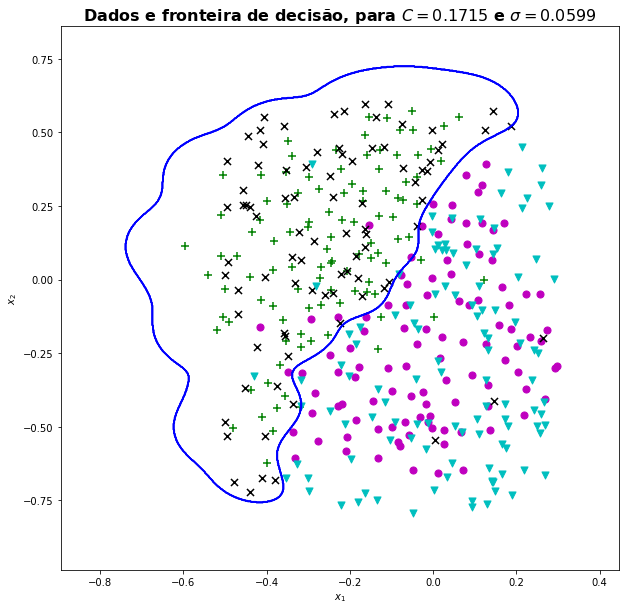

In [81]:
plt.figure(figsize=(10,10))


classifier = SVC(kernel="rbf", C = C_otimo, gamma = (1/2)*s_otimo**(-2) )
classifier.fit(X,np.ravel(y))

m,n = X.shape[0],X.shape[1]
pos,neg = (y==1).reshape(m,1),(y==0).reshape(m,1)

plt.scatter(X[pos[:,0],0],X[pos[:,0],1],c="g",marker="+",s=50)
plt.scatter(X[neg[:,0],0],X[neg[:,0],1],c="m",marker="o",s=50)


m,n = X_val.shape[0],X_val.shape[1]
pos,neg = (y_val==1).reshape(m,1),(y_val==0).reshape(m,1)
plt.scatter(X_val[pos[:,0],0],X_val[pos[:,0],1],c="k",marker="x",s=50)
plt.scatter(X_val[neg[:,0],0],X_val[neg[:,0],1],c="c",marker="v",s=50)




sc_p = .5 # 0 < sc_p < 1; escala percentual; o quanto (percentual em relacao aos limites dos dados de treino) vc quer que o grafico aumente para plotar o contorno
X_1min = [X[:,0].min()*(1 - sc_p) if X[:,0].min() > 0 else X[:,0].min()*(1 + sc_p) for i in range(1)][0]
X_1max = [X[:,0].max()*(1 + sc_p) if X[:,0].max() > 0 else X[:,0].max()*(1 - sc_p) for i in range(1)][0]
X_2min = [X[:,1].min()*(1 - sc_p) if X[:,1].min() > 0 else X[:,1].min()*(1 + sc_p) for i in range(1)][0]
X_2max = [X[:,1].max()*(1 + sc_p) if X[:,1].max() > 0 else X[:,1].max()*(1 - sc_p) for i in range(1)][0]

X_1,X_2 = np.meshgrid(np.linspace(X_1min, X_1max,num=1000),np.linspace(X_2min,X_2max,num=1000))
plt.contour(X_1,X_2,classifier.predict(np.array([X_1.ravel(),X_2.ravel()]).T).reshape(X_1.shape),1,colors="b")
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')

plt.contour(X_1,X_2,classifier.predict(np.array([X_1.ravel(),X_2.ravel()]).T).reshape(X_1.shape),1,colors="b")
plt.title("Dados e fronteira de decisão, para $C = " + str(round(C_otimo, 4)) + '$ e $\sigma = $' + '$' + str(round(s_otimo, 4)) + '$', fontdict={'weight': 'bold', 'size':16})
#plt.xlim(0,4.5)
#plt.ylim(1.5,5)
#plt.grid()
plt.savefig('svm_gauss_Hps_otimos.png')
plt.show()

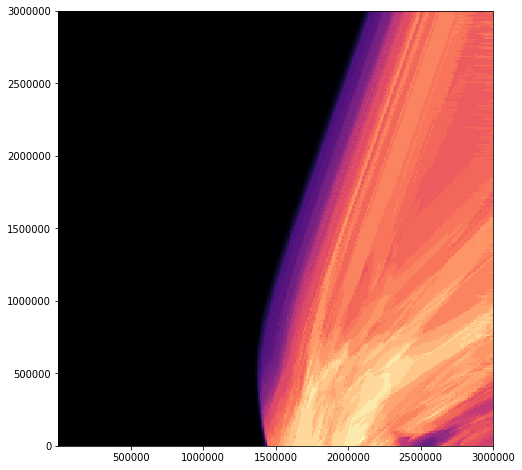

In [207]:
plt.figure(figsize=(8,8))

x_labels = ['$10^{' + str(int(np.log10(si))) + '}$' for si in s]
y_labels = ['$10^{' + str(int(np.log10(Ci))) + '}$' for Ci in s]

fig, ax = plt.subplots()
ax.imshow(Hp**8, cmap = 'magma', extent=[s_min, s_max, C_min, C_max])
# put the major ticks at the middle of each cell
ax.set_xticks(np.arange(len(x_labels)) + 0, minor=False)
ax.set_yticks(np.arange(len(y_labels)) + 0, minor=False)

# want a more natural, table-like display
#ax.invert_yaxis()
#ax.xaxis.tick_top()

ax.set_xticklabels(x_labels, minor=False)
ax.set_yticklabels(y_labels, minor=False)


plt.savefig('com_tick_label_log.png')





plt.show()

In [204]:
Hp.shape

(300, 300)

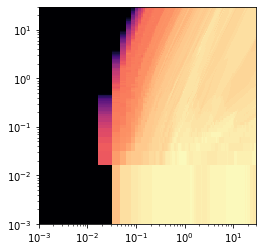

In [178]:

plt.imshow(Hp, cmap = 'magma', extent=[s_min, s_max, C_min, C_max] )
plt.xscale('log')
plt.yscale('log')
plt.show()

In [172]:
import matplotlib
#plt.xscale('log')
#plt.yscale('log')
fig, ax = plt.subplots()
#ax.axis([s_min, s_max, C_min, C_max])
plt.imshow(Hp, extent=[s_min, s_max, C_min, C_max], cmap = 'magma')
ax.axis(np.log10(np.array([s_min, s_max, C_min, C_max])))
ax.loglog()
plt.show()

ValueError: math domain error

<Figure size 432x288 with 1 Axes>

_____________________________________________________________________________

# Parte II - Análise de Componentes Principais

In [7]:
mat = loadmat("dado3.mat")
X = mat["X"]